<a href="https://colab.research.google.com/github/dhan4567/Machine_Learning_Projects/blob/main/Location_Based_AnalysisOf_Restaurants.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Import **Libraries**

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import folium
from folium.plugins import MarkerCluster

Load **Dataset**

In [ ]:
df = pd.read_csv("/content/Dataset .csv")

In [ ]:
df.head()

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [ ]:
df.shape

(9551, 21)

Data **Preprossesing**

In [ ]:
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


Handling Missing **Values**

In [ ]:
df["Latitude"]=df["Latitude"].fillna(df["Latitude"]).mean()
df["Longitude"]=df["Longitude"].fillna(df["Longitude"]).mean()
df["Price range"]=df["Price range"].fillna(df["Price range"]).mode()[0]
df["Aggregate rating"]=df["Aggregate rating"].fillna(df["Aggregate rating"]).mean()
df["Cuisines"]=df["Cuisines"].fillna("unknown")

Remove **Duplicates**

In [ ]:
df.drop_duplicates(inplace=True)

Explore Latitude And **Longitude**

In [ ]:
print(df[["Latitude","Longitude"]].describe())

           Latitude     Longitude
count  9.551000e+03  9.551000e+03
mean   2.585438e+01  6.412657e+01
std    4.998930e-12  8.029553e-12
min    2.585438e+01  6.412657e+01
25%    2.585438e+01  6.412657e+01
50%    2.585438e+01  6.412657e+01
75%    2.585438e+01  6.412657e+01
max    2.585438e+01  6.412657e+01


Visualize Restaurant Distribution On **Map**

In [ ]:
restaurant_map = folium.Map(
    location=[
    df["Latitude"].mean(),
    df["Longitude"].mean()
],zoom_start=5
)

Add Restaurant **Markers**

In [ ]:
marker_cluster = MarkerCluster().add_to(restaurant_map)
for index,row in df.iterrows():
  folium.Marker(
      location=[
          row["Latitude"],
          row["Longitude"]
      ],
      popup=row["Restaurant Name"],
      icon=folium.Icon(color="red")
  ).add_to(marker_cluster)
restaurant_map

Save The **Map**

In [ ]:
restaurant_map.save("restaurant_map.html")

Analyze Restaurant Concentration By **City**

In [ ]:
city_counts = df["City"].value_counts()
print(city_counts.head(10))

City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Lucknow           21
Ahmedabad         21
Amritsar          21
Guwahati          21
Name: count, dtype: int64


**Visualization**

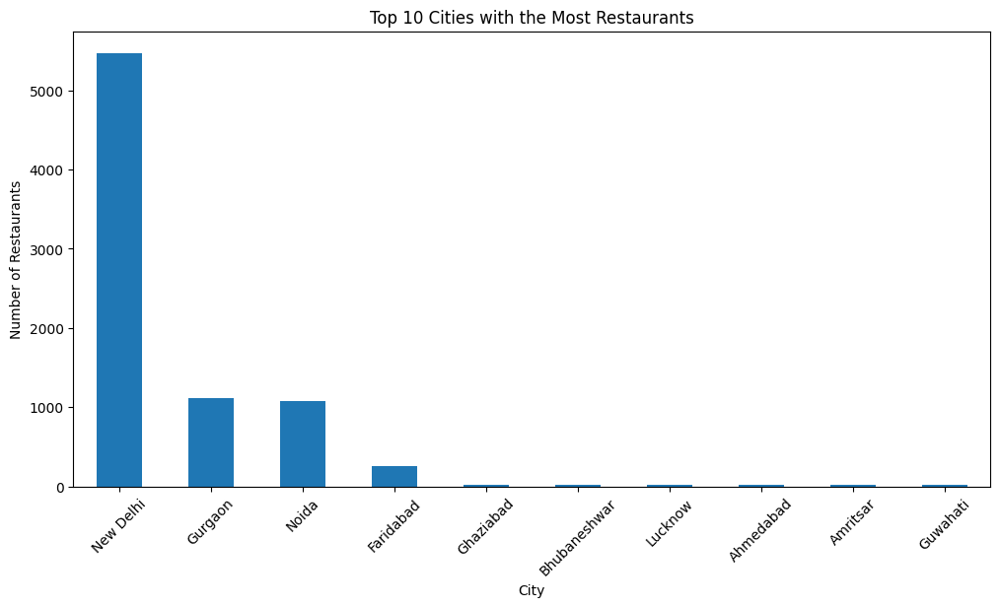

In [ ]:
plt.figure(figsize=(12,6))

city_counts.head(10).plot(
    kind='bar'
)

plt.title("Top 10 Cities with the Most Restaurants")
plt.xlabel("City")
plt.ylabel("Number of Restaurants")
plt.xticks(rotation=45)
plt.show()

  Analyze Concentration By **Locality**

In [ ]:
locality_counts = df['Locality'].value_counts()
print(locality_counts.head(10))

Locality
Connaught Place        122
Rajouri Garden          99
Shahdara                87
Defence Colony          86
Malviya Nagar           85
Pitampura               85
Mayur Vihar Phase 1     84
Rajinder Nagar          81
Safdarjung              80
Satyaniketan            79
Name: count, dtype: int64


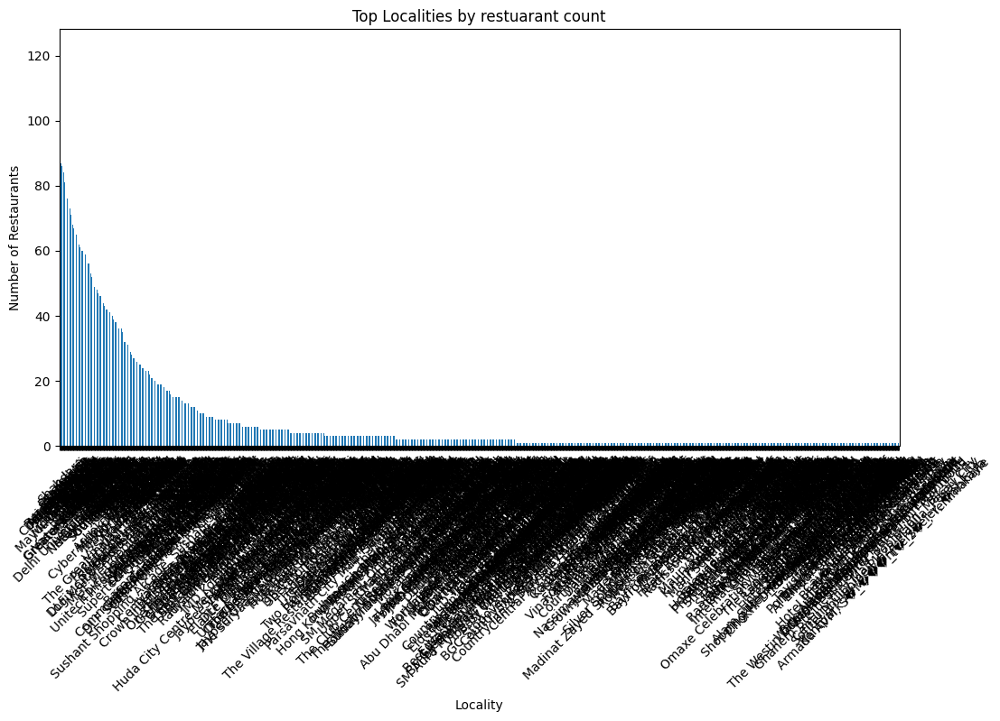

In [ ]:
plt.figure(figsize=(12,6))

locality_counts.plot(
    kind='bar'
)

plt.title("Top Localities by restuarant count")
plt.xlabel("Locality")
plt.ylabel("Number of Restaurants")
plt.xticks(rotation=45)
plt.show()

Average Rating By **City**

In [ ]:
city_ratings = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
print(city_ratings.head(10))

City
Ghaziabad    2.66637
Agra         2.66637
Ahmedabad    2.66637
Albany       2.66637
Abu Dhabi    2.66637
Amritsar     2.66637
Ankara       2.66637
Armidale     2.66637
Athens       2.66637
Auckland     2.66637
Name: Aggregate rating, dtype: float64


**Visualization**

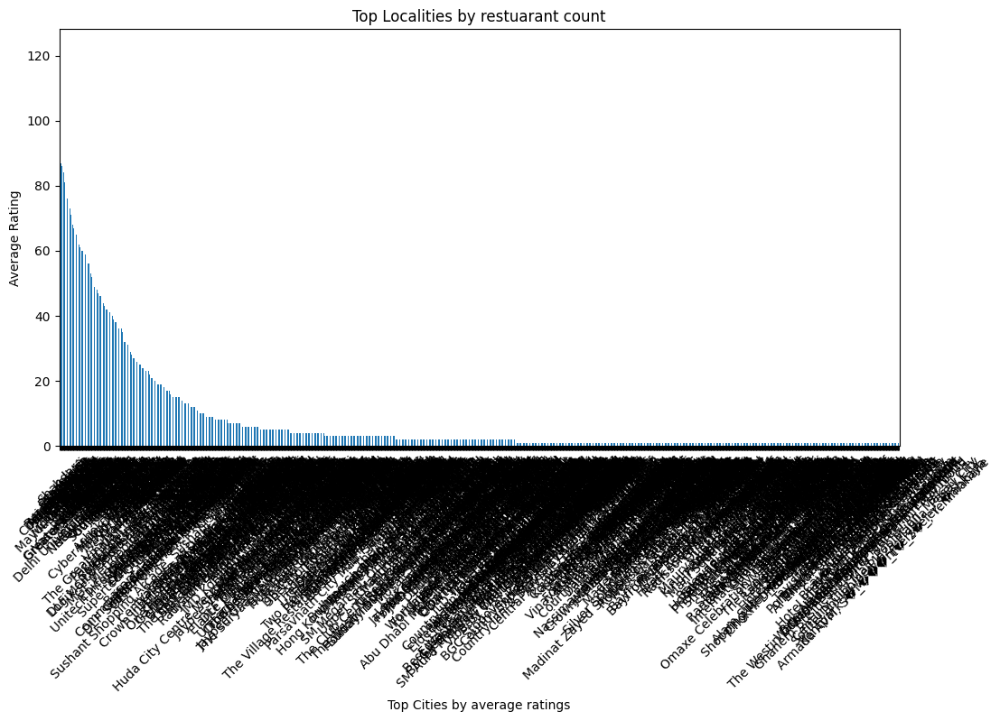

In [ ]:
plt.figure(figsize=(12,6))

locality_counts.plot(
    kind='bar'
)

plt.title("Top Localities by restuarant count")
plt.xlabel("Top Cities by average ratings")
plt.ylabel("Average Rating")
plt.xticks(rotation=45)
plt.show()

Average Price Range By **City**

In [ ]:
city_price = (
    df.groupby('City')
    ['Price range']
    .mean()
    .sort_values(
        ascending=False
    )
)

print(city_price.head(10))

City
Abu Dhabi    1.0
Agra         1.0
Ahmedabad    1.0
Albany       1.0
Allahabad    1.0
Amritsar     1.0
Ankara       1.0
Armidale     1.0
Athens       1.0
Auckland     1.0
Name: Price range, dtype: float64


**Visualization**

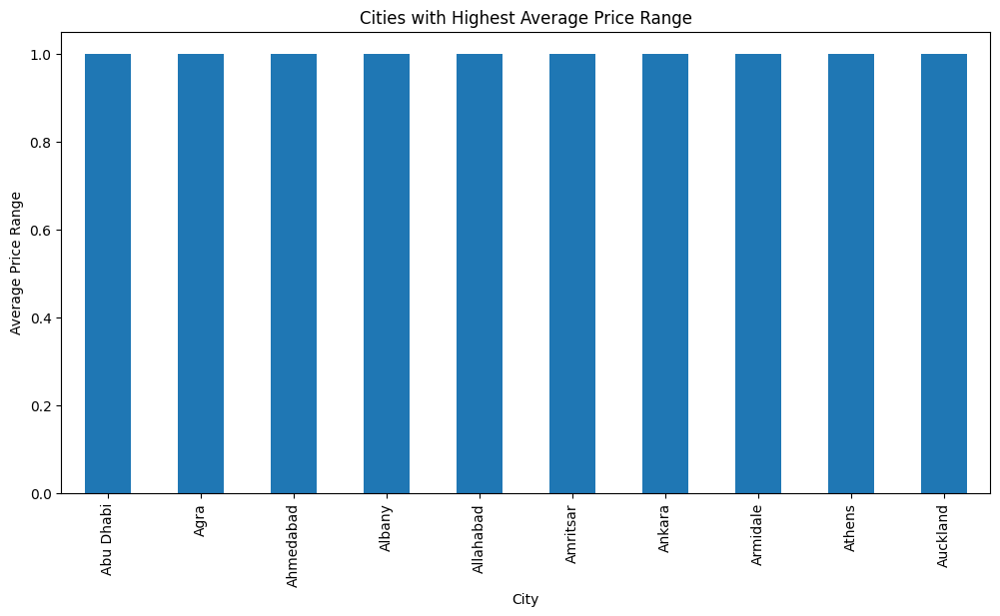

In [ ]:
plt.figure(figsize=(12,6))

city_price.head(10).plot(
    kind='bar'
)

plt.title(
    'Cities with Highest Average Price Range'
)

plt.ylabel(
    'Average Price Range'
)

plt.show()

MOST popular Cuisines By **City**

In [ ]:
popular_cuisines = (
    df.groupby('City')
    ['Cuisines']
    .agg(
        lambda x:
        x.value_counts().index[0]
    )
)

print(popular_cuisines.head(20))

City
Abu Dhabi                                                American
Agra                                        North Indian, Mughlai
Ahmedabad       Chinese, Italian, North Indian, Mexican, Medit...
Albany                                                    unknown
Allahabad                                   North Indian, Chinese
Amritsar                                             North Indian
Ankara                                       Kebab, Turkish Pizza
Armidale                                          Bar Food, Steak
Athens                                   American, Italian, Pizza
Auckland                                                 Desserts
Augusta                                                   Mexican
Aurangabad                                           North Indian
Balingup                                        Modern Australian
Bandung                             Cafe, Coffee and Tea, Western
Bangalore                                    Pizza, Cafe, Italian
Beech

Correlation **Analysis**

In [ ]:
numeric_columns = [
    'Aggregate rating',
    'Price range',
    'Votes'
]

correlation = (
    df[numeric_columns]
    .corr()
)

print(correlation)

                  Aggregate rating  Price range  Votes
Aggregate rating               NaN          NaN    NaN
Price range                    NaN          NaN    NaN
Votes                          NaN          NaN    1.0


**HeatMap**

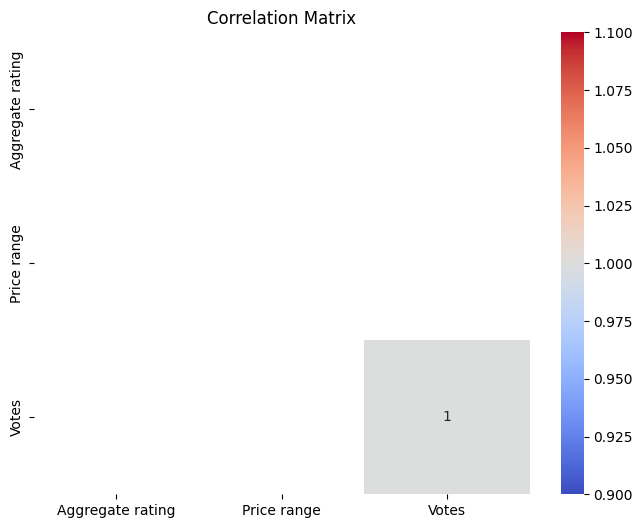

In [ ]:
plt.figure(
    figsize=(8,6)
)

sns.heatmap(
    correlation,
    annot=True,
    cmap='coolwarm'
)

plt.title(
    'Correlation Matrix'
)

plt.show()

Restaurant Density **Map**

In [ ]:
from folium.plugins import HeatMap

heat_data = df[
    ['Latitude', 'Longitude']
].values.tolist()

heat_map = folium.Map(
    location=[
        df['Latitude'].mean(),
        df['Longitude'].mean()
    ],
    zoom_start=5
)

HeatMap(
    heat_data
).add_to(
    heat_map
)

heat_map.save(
    "restaurant_heatmap.html"
)